In [29]:
import os
import sys
import numpy as np
import pandas as pd
import tensorflow
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, InputLayer, BatchNormalization
import re
import matplotlib.pyplot as plt

In [83]:
strDataDir = r'/project/hackathon/hackers12/shared/alex_models'
lModelOutput = os.listdir(strDataDir)
lModelOutput = [xi for xi in lModelOutput if '.csv' in xi]
lModelOutput.sort(key = lambda x: int(re.findall('[0-9]+', x)[0]))

In [107]:
def fPlotLearningCurve(strModelOutput, figsize=[14,4], epochs=100):
    dfPerformance = pd.read_csv(os.path.join(strDataDir,strModelOutput), index_col=0)
    lValAccCols = [xi for xi in dfPerformance.columns.tolist() if 'val_acc' in xi]
    lTrainAccCols = [xi for xi in dfPerformance.columns.tolist() if ('acc' in xi) and (not 'val' in xi)]
    plt.figure(figsize=figsize)
    ax0 = plt.subplot(1,2,1)
    for strCol in lValAccCols:
        ax0.plot(dfPerformance[strCol])
    ax0.set_xlim([-1,epochs])
    ax1 = plt.subplot(1,2,2)
    for strCol in lTrainAccCols:
        ax1.plot(dfPerformance[lTrainAccCols])
    ax1.set_xlim([-1,epochs])
    plt.show()

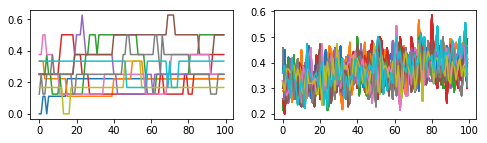

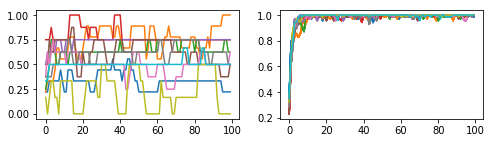

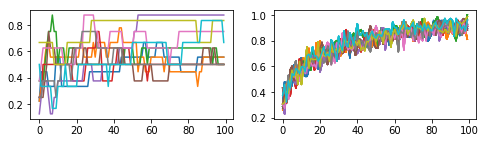

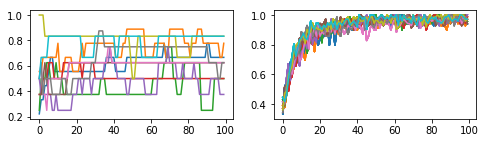

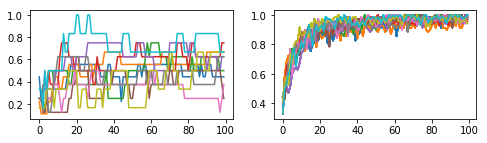

...

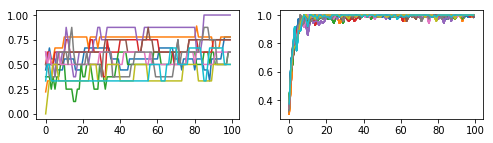

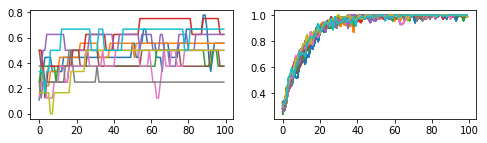

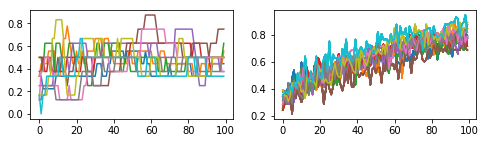

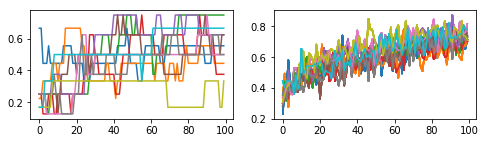

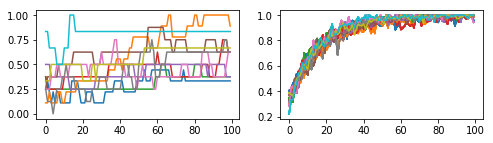

In [88]:
for strModelOutput in lModelOutput:
    fPlotLearningCurve(strModelOutput)


In [96]:
dfModelPerformance = pd.DataFrame()
for strModelOutput in lModelOutput:
    intModelIndex = int(re.findall('[0-9]+', strModelOutput)[0])
    dfPerformance = pd.read_csv(os.path.join(strDataDir,strModelOutput), index_col=0)
    lValAccCols = [xi for xi in dfPerformance.columns.tolist() if 'val_acc' in xi]
    lTrainAccCols = [xi for xi in dfPerformance.columns.tolist() if ('acc' in xi) and (not 'val' in xi)]
    
    sValMean = np.mean(dfPerformance[lValAccCols], axis=1)
    intMaxInt = sValMean.values.argmax()
    sValStd = np.std(dfPerformance[lValAccCols], axis=1)
    
    sToAdd = pd.Series({'Mean': sValMean.loc[intMaxInt], 'Std': sValStd.loc[intMaxInt], 'Epochs':intMaxInt}, name=intModelIndex)
    dfModelPerformance = dfModelPerformance.append(sToAdd)
    #plt.errorbar(x=intModelIndex, y=[sValMean.loc[intMaxInt]], yerr=[sValStd.loc[intMaxInt]])
    #break

In [97]:
dfModelPerformance.sort_values(by='Mean', ascending=False).head()

,Epochs,Mean,Std
188,57.0,0.744444,0.173494
43,83.0,0.744444,0.165761
141,57.0,0.740278,0.136232
56,46.0,0.725000,0.104268
154,37.0,0.723611,0.133860


In [116]:
dfModelPerformance.to_csv(r'/project/hackathon/hackers12/shared/Random_Search_Results_Named_Data.csv')

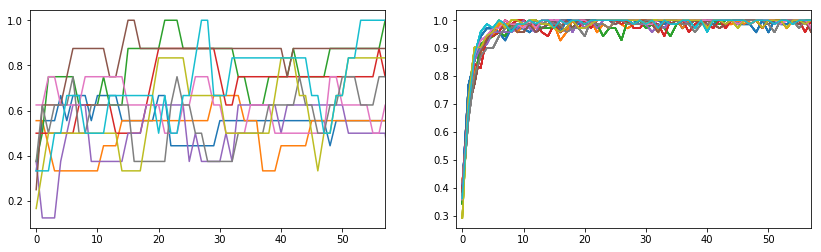

In [108]:
fPlotLearningCurve('model188.csv', epochs=57)